<html>
<h1  align="center"> Desafío: Modelo de Prediccion de Precio de Propiedades
    <hr>
    <img align="center;" style="background-color:
#253bff"; color:"#ff5d25";" src="https://www.iberdrola.com/documents/20125/40921/machine_learning_746x419.jpg/15ff7571-4cfc-d9f0-5ef4-9c2e9306ad88?t=1627968463400"; width="30%"; height="20%">

</h1>
</html>



<h1 align="center">Índice del análisis</h1>

- [**Data Wrangling**](#Data-Wrangling)
- [**Visualizaciones Post Limpieza**](#Visualizaciones-Post-Limpieza)
- [**Regresion Lineal**](#Regresion-Lineal)

<html><h1 align="center", style="background: #414ce8; color:white">Data Wrangling</h1></html>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pandas as pd
import numpy as np
import plotly.io as pio
import plotly.express as px
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
import matplotlib.patches
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from math import sqrt
import warnings

warnings.filterwarnings('ignore')


df_caba = pd.read_csv('/content/drive/MyDrive/portafolio_karen/df_caba.csv', index_col = 'index')

In [4]:
df_caba.head(3)

,property_type,place_name,place_with_parent_names,state_name,geonames_id,lat-lon,lat,lon,price,currency,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,rooms,properati_url,description,title,image_thumbnail,ambientes,parrilla
index,,,,,,,,,,,,,,,,,,,,,
0,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,-58.508839,62000.0,USD,...,40.0,1127.272727,1550.000000,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...,2.0,0
1,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,-58.522982,72000.0,USD,...,55.0,1309.090909,1309.090909,NaN,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...,2.0,0
2,PH,Liniers,|Argentina|Capital Federal|Liniers|,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,-58.516424,95000.0,USD,...,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15boh_venta_ph_lin...,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado,https://thumbs4.properati.com/3/DgIfX-85Mog5SP...,3.0,0


In [5]:
df_caba = df_caba.loc[df_caba['place_name'] != 'Capital Federal']
df_caba.reset_index(drop=True, inplace=True)

In [6]:
df_caba.shape

(29560, 23)

In [7]:
df_caba.head(5)

,property_type,place_name,place_with_parent_names,state_name,geonames_id,lat-lon,lat,lon,price,currency,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,rooms,properati_url,description,title,image_thumbnail,ambientes,parrilla
0,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,-58.508839,62000.0,USD,...,40.0,1127.272727,1550.000000,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...,2.0,0
1,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,-58.522982,72000.0,USD,...,55.0,1309.090909,1309.090909,NaN,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...,2.0,0
2,PH,Liniers,|Argentina|Capital Federal|Liniers|,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,-58.516424,95000.0,USD,...,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15boh_venta_ph_lin...,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado,https://thumbs4.properati.com/3/DgIfX-85Mog5SP...,3.0,0
3,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Capital Federal,3436077.0,"-34.5598729,-58.443362",-34.559873,-58.443362,138000.0,USD,...,40.0,3066.666667,3450.000000,NaN,http://www.properati.com.ar/15bot_venta_depart...,EXCELENTE MONOAMBIENTE A ESTRENAR AMPLIO SUPER...,JOSE HERNANDEZ 1400 MONOAMBIENTE ESTRENAR CAT...,https://thumbs4.properati.com/1/IHxARynlr8sPEW...,1.0,0
4,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Capital Federal,3436077.0,"-34.5598729,-58.443362",-34.559873,-58.443362,195000.0,USD,...,60.0,3000.000000,3250.000000,NaN,http://www.properati.com.ar/15bou_venta_depart...,EXCELENTE DOS AMBIENTES ESTRENAR AMPLIO SUPER...,"JOSE HERNANDEZ 1400 DOS AMBIENTES ESTRENAR ,...",https://thumbs4.properati.com/2/J3zOjgaFHrkvnv...,2.0,0


In [8]:
round(df_caba.isnull().sum() / df_caba.shape[0],2).sort_values(ascending = False)

rooms                         0.52
ambientes                     0.33
price_usd_per_m2              0.28
lat-lon                       0.24
lat                           0.24
lon                           0.24
surface_total_in_m2           0.19
price_per_m2                  0.15
price_aprox_local_currency    0.10
price_aprox_usd               0.10
currency                      0.10
price                         0.10
surface_covered_in_m2         0.06
geonames_id                   0.04
image_thumbnail               0.02
title                         0.00
description                   0.00
property_type                 0.00
properati_url                 0.00
place_name                    0.00
state_name                    0.00
place_with_parent_names       0.00
parrilla                      0.00
dtype: float64

In [9]:
def getPlotGroup(data, number_color):
    x = data.groupby('place_name')['price_usd_per_m2'].std().sort_values(ascending = False).index
    y = data.groupby('place_name')['price_usd_per_m2'].std().sort_values(ascending = False).values

    df = pd.DataFrame({'x': x, 'y': y})
    fig = px.bar(df, x=x, y=y,
                title= 'Desvio Standard del Precio en USD por m2 ',
                color_discrete_sequence=[px.colors.qualitative.Alphabet[number_color]],
                width=800, height=600,
                template="simple_white"
                )
    return fig.show()


getPlotGroup(df_caba,  7)

Grafico en 3D donde relacionamos las siguientes variables por zona: price_usd_per_m2, surface_covered_in_m2 y ambientes.

In [73]:
import plotly.express as px

def plot3d(df, x, y, z, color):
    fig = px.scatter_3d(df,
                        title="3D Plot",
                        x=x,
                        y=y,
                        z=z,
                        color=color)
    fig.update_layout(template="plotly_dark",
                      width=800,
                      height=700)
    return fig

# Llamada a la función para generar la figura
figura = plot3d(df_caba, 'price_usd_per_m2', 'surface_covered_in_m2', 'ambientes', 'place_name')

# Mostrar la figura fuera de la función
figura.show()


Grafico en 3D donde relacionamos las siguientes variables por tipo de propiedad: price_usd_per_m2, surface_covered_in_m2 y ambientes.

In [74]:

plot3d(df_caba, 'price_usd_per_m2', 'surface_covered_in_m2', 'ambientes', 'property_type')

In [12]:
hist_data    = []
group_labels = []
limite_superficie = 1000
for i in range(len(df_caba['place_name'].unique())):
    hist_datas = np.array(df_caba.loc[( df_caba['place_name'].isin([df_caba['place_name'].unique()[i]]) ) &  (df_caba['surface_covered_in_m2'] < limite_superficie)].surface_covered_in_m2.value_counts().index)
    hist_data.append(hist_datas)
    group_labels.append(df_caba['place_name'].unique()[i])
fig = ff.create_distplot(hist_data, group_labels, show_hist=False)
fig.update_layout(title_text='Distribucion de la Superficie Cubierta por M2')
fig.show()

In [13]:
hist_data    = []
group_labels = []
limite_precio = 9000
for i in range(len(df_caba['place_name'].unique())):
    hist_datas = np.array(df_caba.loc[( df_caba['place_name'].isin([df_caba['place_name'].unique()[i]]))&  (df_caba['price_usd_per_m2'] < limite_precio) ].price_usd_per_m2.value_counts().index)
    if len(hist_datas) == 1: continue
    hist_data.append(hist_datas)
    group_labels.append(df_caba['place_name'].unique()[i])
fig = ff.create_distplot(hist_data, group_labels, show_hist=False)
fig.update_layout(title_text='Distribucion del precio en USD por M2')
fig.show()

<h3> Limpieza de Datos </h3>

In [14]:
df_caba_model = df_caba[['price_usd_per_m2','property_type','place_name', 'price', 'price_aprox_usd', 'surface_total_in_m2', 'surface_covered_in_m2','rooms', 'ambientes', 'parrilla']]
df_caba_model.head(5)

,price_usd_per_m2,property_type,place_name,price,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,rooms,ambientes,parrilla
0,1127.272727,PH,Mataderos,62000.0,62000.0,55.0,40.0,NaN,2.0,0
1,1309.090909,apartment,Mataderos,72000.0,72000.0,55.0,55.0,NaN,2.0,0
2,NaN,PH,Liniers,95000.0,95000.0,NaN,NaN,NaN,3.0,0
3,3066.666667,apartment,Belgrano,138000.0,138000.0,45.0,40.0,NaN,1.0,0
4,3000.000000,apartment,Belgrano,195000.0,195000.0,65.0,60.0,NaN,2.0,0


In [15]:

df_caba_filter = df_caba_model.loc[df_caba_model['place_name'].isin(['Boedo', 'Puerto Madero', 'Palermo', 'Saavedra'])]
df_caba_filter["ambientes"] = df_caba_filter["ambientes"].astype(str)
fig = px.scatter(df_caba_filter, x="surface_covered_in_m2", y="price_usd_per_m2", color="place_name",
                  hover_data=['place_name'], title = 'Scatter Plot Precio y Superficie Separado por place_name')
fig.show()


In [16]:

df_caba_filter = df_caba_model.loc[df_caba_model['place_name'].isin(['Boedo'])]

df_caba_filter["ambientes"] = df_caba_filter["ambientes"].astype(str)
fig = px.scatter(df_caba_filter, x="surface_covered_in_m2", y="price_usd_per_m2", color="property_type",
                  hover_data=['property_type'], title = 'Scatter Plot Precio y Superficie Separado por place_name')
fig.show()

Completamos la columna ambientes combinandola con rooms:

In [17]:
df_caba_model['ambientes'] = df_caba_model.apply(lambda x: x['ambientes'] if x['ambientes'] > 0 else x['rooms'], axis = 1)

In [18]:
df_caba_model.drop(columns=['rooms','price_aprox_usd','price'], inplace = True)

In [19]:
round(df_caba_model.isnull().sum() / df_caba_model.shape[0],2).sort_values(ascending = False)

price_usd_per_m2         0.28
surface_total_in_m2      0.19
ambientes                0.19
surface_covered_in_m2    0.06
property_type            0.00
place_name               0.00
parrilla                 0.00
dtype: float64

In [20]:
print('Luego de los drop queda un ',(df_caba_model.dropna().shape[0] / df_caba_model.shape[0]) * 100, '% del Data Set original')

Luego de los drop queda un  56.123139377537214 % del Data Set original


Podemos observar valores en precio en dolares por metro cuadrado y superficie cubierta fuera de lo normal en Boedo.

In [21]:
x1 = np.array(df_caba_model.loc[df_caba_model['place_name'].isin(['Boedo'])].price_usd_per_m2.value_counts().sort_index(ascending = False).index)

hist_data = [x1]
group_labels = ['price_usd_per_m2']

fig = ff.create_distplot(hist_data, group_labels, bin_size=400)
fig.show()

In [22]:
x1 = np.array(df_caba_model.loc[df_caba_model['place_name'].isin(['Boedo'])].surface_covered_in_m2.value_counts().sort_index(ascending = False).index)

hist_data = [x1]
group_labels = ['surface_covered_in_m2']

fig = ff.create_distplot(hist_data, group_labels, bin_size=5)
fig.show()

In [23]:
x1 = np.array(df_caba_model.loc[df_caba_model['place_name'].isin(['San Cristobal'])].price_usd_per_m2.value_counts().sort_index(ascending = False).index)

hist_data = [x1]
group_labels = ['price_usd_per_m2']

fig = ff.create_distplot(hist_data, group_labels, bin_size=5)
fig.show()

Limpiamos esos datos del Data Set

In [24]:
index_drop_surface = df_caba_model.loc[(df_caba_model['place_name'].isin(['Boedo'])) & (df_caba_model['surface_covered_in_m2'].isin([324,350,566,600,800]))].index
index_drop_price_boedo = df_caba_model.loc[(df_caba_model['place_name'].isin(['Boedo'])) & (df_caba_model['price_usd_per_m2'] > 3000)].index
index_drop_price_sancristobal = df_caba_model.loc[(df_caba_model['place_name'].isin(['San Cristobal'])) & (df_caba_model['price_usd_per_m2'] > 3000)].index
index_drop_price_low = df_caba_model.loc[df_caba_model['price_usd_per_m2'] < 500].index

In [25]:
df_caba_model.drop(index_drop_surface, inplace=True)
df_caba_model.drop(index_drop_price_boedo, inplace=True)
df_caba_model.drop(index_drop_price_sancristobal, inplace=True)
df_caba_model.drop(index_drop_price_low, inplace=True)

In [26]:
df_caba_model.reset_index(drop=True, inplace=True)

Scatter para Boedo:

In [27]:

df_caba_filter = df_caba_model.loc[df_caba_model['place_name'].isin(['Boedo'])]

df_caba_filter["ambientes"] = df_caba_filter["ambientes"].astype(str)
fig = px.scatter(df_caba_filter, x="surface_covered_in_m2", y="price_usd_per_m2", color="property_type",
                  hover_data=['property_type'], title = 'Scatter Plot Precio y Superficie Separado por place_name')
fig.show()

Scatter previo a la limpieza de valores atipicos para superficie cubierta:

In [75]:
fig = px.scatter(df_caba_model, x="surface_total_in_m2", y="price_usd_per_m2", color="property_type", hover_data=['property_type'])
fig.show()

In [76]:
fig = px.scatter(df_caba_model, x="surface_covered_in_m2", y="price_usd_per_m2", color="property_type", hover_data=['property_type'])
fig.show()

In [30]:
Çdf_caba_model['surface_covered_in_m2'].sort_values(ascending = False)[0:10]

18334    187000.0
16137     10958.0
13157      9152.0
13234      8175.0
15756      7722.0
15415      7029.0
25671      6534.0
27199      6062.0
1204       5350.0
20442      5079.0
Name: surface_covered_in_m2, dtype: float64

In [77]:
fig = px.scatter(df_caba_model, x="ambientes", y="price_usd_per_m2", color="property_type", hover_data=['property_type'])
fig.show()

In [32]:
index_drop_surface_total = df_caba_model.loc[(df_caba_model['surface_total_in_m2'] > 800)].index
df_caba_model.drop(index_drop_surface_total, inplace=True)
df_caba_model.reset_index(drop=True, inplace=True)

In [33]:
index_drop_surface_covered = df_caba_model.loc[(df_caba_model['surface_covered_in_m2'] > 800)].index
df_caba_model.drop(index_drop_surface_covered, inplace=True)
df_caba_model.reset_index(drop=True, inplace=True)

In [34]:
index_drop_ambientes = df_caba_model.loc[(df_caba_model['ambientes'] > 10)].index
df_caba_model.drop(index_drop_ambientes, inplace=True)
df_caba_model.reset_index(drop=True, inplace=True)

<html><h1 align="center", style="background: #414ce8; color:white">Visualizaciones Post Limpieza</h1></html>

In [35]:
getPlotGroup(df_caba_model,  3)

In [78]:
fig = px.scatter(df_caba_model, x="surface_total_in_m2", y="price_usd_per_m2", color="property_type", hover_data=['property_type'])
fig.show()

In [79]:
plot3d(df_caba_model, 'price_usd_per_m2', 'surface_total_in_m2', 'ambientes', 'property_type')

In [80]:

plot3d(df_caba_model, 'price_usd_per_m2', 'surface_total_in_m2', 'ambientes', 'place_name')

In [39]:
hist_data    = []
group_labels = []
limite_superficie = 350
for i in range(len(df_caba_model['place_name'].unique())):
    hist_datas = np.array(df_caba_model.loc[( df_caba_model['place_name'].isin([df_caba_model['place_name'].unique()[i]]) ) &  (df_caba_model['surface_covered_in_m2'] < limite_superficie)].surface_covered_in_m2.value_counts().index)
    hist_data.append(hist_datas)
    group_labels.append(df_caba_model['place_name'].unique()[i])
fig = ff.create_distplot(hist_data, group_labels, show_hist=False)
fig.update_layout(title_text='Distribucion de la Superficie Cubierta por M2')
fig.show()


In [40]:
hist_data    = []
group_labels = []

for i in range(len(df_caba_model['place_name'].unique())):
    hist_datas = np.array(df_caba_model.loc[( df_caba_model['place_name'].isin([df_caba_model['place_name'].unique()[i]]))].price_usd_per_m2.value_counts().index)
    if len(hist_datas) == 1: continue
    hist_data.append(hist_datas)
    group_labels.append(df_caba_model['place_name'].unique()[i])
fig = ff.create_distplot(hist_data, group_labels, show_hist=False)
fig.update_layout(title_text='Distribucion del precio en USD por M2')
fig.show()

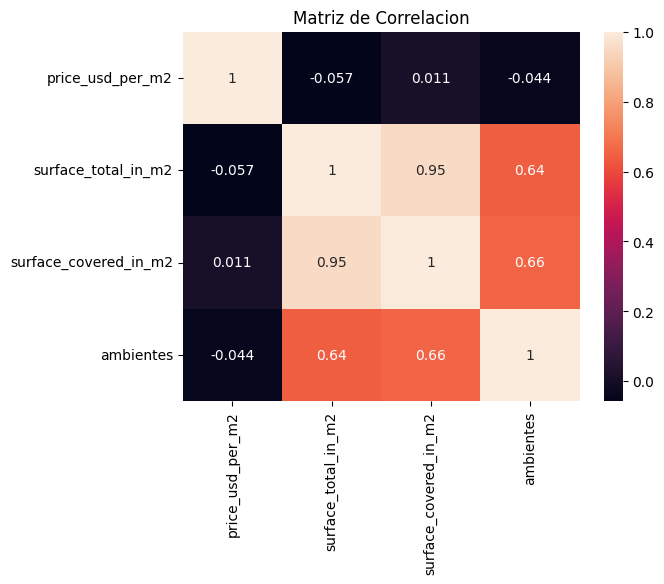

In [41]:
import seaborn as sns
correlation_mat = df_caba_model[['price_usd_per_m2', 'surface_total_in_m2', 'surface_covered_in_m2',
       'ambientes']].corr()
sns.heatmap(correlation_mat, annot = True)
plt.title("Matriz de Correlacion")
plt.show()

<html><h1 align="center", style="background: #414ce8; color:white">Regresion Lineal</h1></html>

El primer paso para estimar los parametros del modelo es eliminar todas las filas que contienen al menos un dato nulo ya que el modelo no nos permite tener este tipo de valores:

In [42]:
observaciones = df_caba_model.shape[0]

El data set pierde la siguiente cantidad de observaciones:

In [43]:
observaciones - df_caba_model.dropna(axis=0).shape[0]

12832

In [44]:
df_caba_model.dropna(axis=0, inplace = True)

In [45]:
fig = px.pie(df_caba_model, values=df_caba_model.property_type.value_counts().values, names=df_caba_model.property_type.value_counts().index, title = 'Pie Chart Property Type')
fig.update_traces(hoverinfo='label+percent', textinfo='value')
fig.show()

In [46]:
df_caba_model = df_caba_model.loc[df_caba_model['property_type'] == 'apartment']

In [47]:
df_caba_model.shape

(14730, 7)

In [48]:
df_caba_model.place_name.value_counts(ascending=True)[0:10].index

Index(['Catalinas', 'Villa Real', 'Villa Soldati', 'Velez Sarsfield',
       'Parque Chas', 'Versalles', 'Pompeya', 'Villa Santa Rita',
       'Parque Avellaneda', 'Palermo Viejo'],
      dtype='object', name='place_name')

In [49]:
df_caba_model_final = df_caba_model.dropna(axis=0)
df_caba_model_final.reset_index(inplace = True,drop=True)

In [50]:
df_caba_model.shape
df_caba_model.to_csv('df_caba_model.csv')

Se crean variable dummies para las features categoricas:

In [51]:
df_caba_model_dummies = pd.get_dummies(df_caba_model_final)

Se separa el data set en training y set:

In [52]:
X = df_caba_model_dummies.drop(columns = ["price_usd_per_m2",'surface_total_in_m2'])
y = df_caba_model_dummies[["price_usd_per_m2"]]

Xtrain, Xtest, ytrain, ytest = train_test_split(X,y)


Se instancia y entrena el modelo de Linear Regression:

In [53]:
modelo = LinearRegression()
modelo.fit(Xtrain,ytrain)

LinearRegression()

In [54]:
# Cross Validation
from sklearn.model_selection import cross_validate
Modelo_cv = LinearRegression()

cv_results = cross_validate(Modelo_cv, X, y, cv=5, scoring=('r2', "neg_mean_absolute_error"))
print(cv_results["test_neg_mean_absolute_error"].mean())
print(cv_results["test_r2"].mean())

-441.8901170603338
0.5550532914074122


In [55]:
diccionario = dict(zip(df_caba_model_dummies.drop(columns = ["price_usd_per_m2",'surface_total_in_m2']).columns,[round(value,2) for value in modelo.coef_.tolist()[0]]))

In [56]:
diccionario

{'surface_covered_in_m2': 1.28,
 'ambientes': -55.18,
 'parrilla': 17.66,
 'property_type_apartment': -0.0,
 'place_name_Abasto': -89.29,
 'place_name_Agronomía': -44.16,
 'place_name_Almagro': -126.66,
 'place_name_Balvanera': -384.15,
 'place_name_Barracas': -332.23,
 'place_name_Barrio Norte': 567.99,
 'place_name_Belgrano': 678.31,
 'place_name_Boca': -628.45,
 'place_name_Boedo': -693.87,
 'place_name_Caballito': 104.54,
 'place_name_Catalinas': -636.36,
 'place_name_Centro / Microcentro': -145.61,
 'place_name_Chacarita': -131.98,
 'place_name_Coghlan': 253.87,
 'place_name_Colegiales': 266.2,
 'place_name_Congreso': -490.86,
 'place_name_Constitución': -574.39,
 'place_name_Flores': -231.74,
 'place_name_Floresta': -426.46,
 'place_name_Las Cañitas': 1064.88,
 'place_name_Liniers': -317.04,
 'place_name_Mataderos': -464.77,
 'place_name_Monserrat': -269.22,
 'place_name_Monte Castro': -331.04,
 'place_name_Nuñez': 542.58,
 'place_name_Once': -537.65,
 'place_name_Palermo': 820.4

In [57]:
dict(sorted(diccionario.items(), key=lambda item: item[1]))

{'place_name_Villa Lugano': -970.04,
 'place_name_Pompeya': -874.12,
 'place_name_Boedo': -693.87,
 'place_name_Catalinas': -636.36,
 'place_name_Boca': -628.45,
 'place_name_Constitución': -574.39,
 'place_name_Once': -537.65,
 'place_name_Congreso': -490.86,
 'place_name_Parque Avellaneda': -489.86,
 'place_name_Versalles': -478.64,
 'place_name_San Cristobal': -475.35,
 'place_name_Mataderos': -464.77,
 'place_name_Velez Sarsfield': -441.67,
 'place_name_Floresta': -426.46,
 'place_name_Villa Real': -406.19,
 'place_name_Parque Patricios': -389.02,
 'place_name_Balvanera': -384.15,
 'place_name_Parque Chacabuco': -367.49,
 'place_name_Barracas': -332.23,
 'place_name_Monte Castro': -331.04,
 'place_name_Villa General Mitre': -326.64,
 'place_name_Liniers': -317.04,
 'place_name_Monserrat': -269.22,
 'place_name_Paternal': -255.74,
 'place_name_Parque Chas': -238.23,
 'place_name_Tribunales': -235.21,
 'place_name_Flores': -231.74,
 'place_name_Villa Luro': -209.68,
 'place_name_Vill

La presencia de Puerto Madero hace incrementar nuestro modelo en 3505.54 dolares el metro cuadrado

In [58]:
diccionario['place_name_Puerto Madero']

3460.73

Para evaluar el modelo se utiliza el MAE y el r2. El MAE es el elegido ya que nos da un valor robusto para nuestro analisis, el valor absoluto del error promedio del modelo

In [59]:
pred = modelo.predict(Xtest)

El **error absoluto medio** (_Mean Absolut Error_ o MAE) es la media del valor absoluto de los errores:

$$ \frac 1n\sum_ {i = 1}^n |y_i-\hat{y}_i| $$

In [60]:
print ('MAE:', metrics.mean_absolute_error(ytest, pred).round(2))
print ('R2:', metrics.r2_score(ytest, pred).round(2))

MAE: 432.98
R2: 0.58


+ Los modelos arrojan los siguientes resultados:
+ El 62 % de la variacion de los valores de Y es explicado por las features

|Modelo||MAE|R2|
|-|-|-|-|
|Regresión Logística Nº1 ||443|0.61|



In [61]:
pred_X = modelo.predict(X)
df_caba_model_dummies["Prediccion"] = pred_X

In [62]:
df_caba_model_dummies[["Prediccion", "price_usd_per_m2"]].sort_values(by = 'Prediccion')

,Prediccion,price_usd_per_m2
4209,1248.207799,784.090909
4208,1248.207799,784.090909
4579,1259.695173,639.175258
3877,1267.651480,1166.666667
2749,1267.651480,800.000000
...,...,...
7315,6086.221676,8000.000000
1525,6087.329624,4584.615385
7316,6175.567912,8809.523810
1491,6222.113374,7500.000000


In [81]:
fig = px.scatter(df_caba_model_dummies, x="Prediccion", y="price_usd_per_m2", title= 'Scatter de Prediccion - MODELO 1')
fig.show()

In [64]:
residuals = [df_caba_model_dummies["Prediccion"] - df_caba_model_dummies["price_usd_per_m2"]]
fig = ff.create_distplot(residuals, ['Errors'], show_hist=False)
fig.update_layout(title_text='Distribucion de los Errores')
fig.show()

In [82]:
from sklearn import preprocessing

df_caba_model_dummies['residuals'] = df_caba_model_dummies["Prediccion"] - df_caba_model_dummies["price_usd_per_m2"]
scaled_features = preprocessing.StandardScaler().fit_transform(df_caba_model_dummies[['residuals']])
df_caba_model_dummies['residuals_scaler'] = scaled_features

fig = px.scatter(df_caba_model_dummies, x="Prediccion", y="residuals_scaler", title= 'Scatter de Prediccion vs residuals')
fig.show()


In [69]:
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import cross_val_score, train_test_split, KFold

cv = KFold(5, shuffle=True)
model = RidgeCV().fit(Xtrain, ytrain)
scores = cross_val_score(model, Xtrain, ytrain, cv=5, scoring='r2')
dict(alpha=model.alpha_, scores=scores, mean_score=scores.mean())


{'alpha': 0.1,
 'scores': array([0.59209925, 0.62556725, 0.5750272 , 0.5929935 , 0.5819012 ]),
 'mean_score': 0.5935176790816855}